In [2]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'horse2zebra-dataset:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F926321%2F1567596%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240330%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240330T135638Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D5aff1ff9fa35fca712ce465532506a4b4af360156440ce8e1931018a9abffbc2b6325af7a70138ebc3172e87bda506b969b691a922bf973508aa015bd8e484cf1ecb2e664452fbd357fd53a9693ff721b95dd343a3c41ed6fc968beb063b0c73fbf808dc714b0cdb95f1c40ded35aeb3bf2f351b59428a9432ab3e3d374aba0e4395b43099746a8557308771cecaeb9c416cdd5fae0b9f873121f340fbd3db4a80b61075161869072e852d58ec8f39303be0e15b1b2a76a359452b5ef25cd4d66ce463b8e690b1297dcf16e3a543cead11fbbff7c3709cecee987e4f3fe67b840e9c2c7a71526cd606c14308ebdb3fc64862dbd3ce5474060ea71d34f29709c8,imagetoimage-translation-cyclegan:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F2486025%2F4217474%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240330%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240330T135638Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D0554695d5cd6aecc08fa857ca51950bccac1b2daf3af0d61fe66171beb65357c88679d0a5d000586f498c3525ce0ba107e2744fff1fd0af0d68d56417d2299a1f6efd78bbdf71f618df49170660ff5aae709fc1e7b55aa8ef932cbb062a282ffde4e7e7b0588a1b8f820e03a09a4e0dcf320e69b5ca9c3425b5ef21e613aab2c1de7ad701aa525573f142225581928fc1ab3c7831b10b4a04d886f14efa38653396d8d60db5c64a299b11a3df6ce2ab6e421855f41e5eaf9acf78ea1bc50ae38d07dcf9f88f50891738eaa6612c513697f8707fbdb1f7b9b662af9c97429b7b6e5a01ac5eaa4f94800c31d5c87ec658836a87101986249c0ec95550399997dc5'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 116809009 bytes downloaded
Downloaded and uncompressed: horse2zebra-dataset
[==================================================] 523920850 bytes downloaded
Downloaded and uncompressed: imagetoimage-translation-cyclegan
Data source import complete.


# **What is CycleGAN?**

**CycleGAN** was proposed in a [2020 Paper](https://arxiv.org/abs/1703.10593?amp=1).

$Intution :$
The main idea of **Cycle GAN** is to utilize the power of **Unpaired Data**, i.e. the Datasets in which the **Inputs and the Labels** are **not directly Related.** A classic example of this is, **Neural Style Transfer**, where **one Input** is an **Image** and the **Other image** is generally a **Painting signifying the Style** to be used. The netework tries to **fuse both the Images** and the main goal is to **Preserve the Spatial Information of the Original Image but apply the Style of the Painting**. The **CycleGAN** have the **same goal** but the **Archictecture** proposed in **one of its kind**.

---
The **application of Cycle GAN** is **more diverse** than **NST**. You can use **Cycle GAN** for $:$

* Conversion between **Monet images to realistic photographs**.
* converting **Day to Night images**.
* Going from **winter images to summer images**.
* Not only that, you can create a **custom Snapchat filter** for yourself that can change **your face to anything that you can imagine**.

> One of the **most interesting application** that **I found** was. Merging images of two or more people together to produce a single image of a person having characteristic of all the people.

> After this notebook, I'm pretty sure that I'm going to come up with 10-15 more notebooks on **Cycle GAN**, covering almost all the applications that I found to be interesting or something like magic.

One of the **main profit** of **Cycle GAN** is that you don't need paired data. This means you can, basically collect data from Internet without even worrying about matching your labels with your features.

---
The **Cycle GAN** paper introduces 2 new terms for us,

* **Cycle Consistency** $:$ I will explain it with respect to architecture in a bit. If you look at it from a mathematical point of view. Then we can say that If there exists a function $F(x) : X -> Y$ , then in another function $G(Y) : Y -> X$. In our case, consider $F(X)$ and $G(Y)$ as **Discriminators**. We want to maintain the *Cycle Consistency*, i.e. $G(F(X)) = X$.

* **Identity** $:$ In simple words, if Y is fed to $F(X)$ then the output should be $Y$ itself.


---
Let's look as the **Model Architecture** $:$

* cycle can consist of 2 **generators** and 2 **discriminators**.

 * The task of one of the generator is to generate type B images from type A images. So if this generator is a function $F(X)$, it goes from $X$ to $Y$.

 * the task of the **second generator** is to **regenerate** the **type A image from type B images**.

**But why do we even need two different generators?**

Let's try to answer this question using an example, our is convert horse images to zebra images.

* The first question then you need to answer is how to actually train the generator. We don't have the label images with the same spatial information as the input images. Then, even if the model generates something, how would you know that the generation is actually correct?.

That's why we have **2 generators**, 1 generator mapping from **Horse images** to **zebra images** and the $2^n$$^d$ generator mapping from **zebra images to horse images**. Here, we introduce a **cycle loss**. That simply means, if the **input image** and the **final output image** after going through both the generators are not same, we will punish the model. This way we encourage the first generator to maintain the spatial information of the original image, but still try to replace a horse from a zebra. The $2^n$$^d$ generator is helpful for applying this process.


As we know, in order to encourage the models to produce the right mask, we need discriminator. That's why we have two different discriminators, one discriminator for each generator. The discriminator architecture is exactly the same as that of the **Pix2Pix Patch GAN Discriminator**.

> One of the major differences that the model does not use is **batch normalization**. Instead it uses **Instance normalization**. This forces each of the **feature map** to contain as much information as possible about **spatial data** as well as **the transforming information**.

This way the whole model has two different generators and two different discriminators. In total, the model has four different losses.

1. Cycle Loss
2. Identity Loss
3. Discriminator 1 Loss
4. Discriminator 2 Loss

---
$Remark :$

A **complete forward cycle** means going from **photo to mapping**, then again from **mapping to the photo**.

A **complete backward cycle** means going from **mapping to photo**, and then from **photo to mapping**.

The **identity** with respect to **generator means** that, If a **mapping image** is passed to the **first generator** then it should return the **same image** without much transformation. This is because it is trained to convert photo to the mapping, but the input is already in mapping so it does not needs to be converted. The same goes for the second generator.

---

If you're not aware about Pix2Pix GAN, I have covered it in [this notebook](https://www.kaggle.com/code/utkarshsaxenadn/pix2pixgan-map-generatorhttps://www.kaggle.com/code/utkarshsaxenadn/pix2pixgan-map-generator).

---

There is **no major difference between** the generation of **Pix2Pix GAN** and **Cycle GAN**. The **major advantage** with **Cycle GAN** is that you **don't need paired images**. That actually **reduces the stress** onf the data set create. If you have ever created a data set, You know what I mean.

---
But that doesn't mean that **Cycle GAN** is the king of **all GANs**. There are some cases when even **Cycle GAN fails**.

# **Imports**

We know that **Cycle GAN** uses **Instance normalization**. But it is not available with **keras**. Don't worry, it is available in **Tensorflow addons**.

In [3]:
from IPython.display import clear_output as clear
!pip install tensorflow-addons
clear()

Let's import all the other libraries that will be needed in this notebook.

In [4]:
# Common
import os
import keras
import numpy as np
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from random import random

# Data
import tensorflow.image as tfi
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array

# Model Layers
from keras.layers import ReLU
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import concatenate
from keras.layers import ZeroPadding2D
from keras.layers import Conv2DTranspose
from tensorflow_addons.layers import InstanceNormalization

# Model Functions
from keras.models import Model
from keras.models import load_model
from keras.models import Sequential
from keras.initializers import RandomNormal

# Optimizers
from tensorflow.keras.optimizers import Adam

# Loss
from keras.losses import BinaryCrossentropy

# Model Viz
from tensorflow.keras.utils import plot_model

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


You can make all the imports in a single line, but I made them in different lines because that just looks good.

# **Custom Functions**

In [5]:
def show_image(image, title=None):
    '''
    The function takes in an image and plots it using Matplotlib.
    '''
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

# **Data**

In [6]:
root_horse_path = '../input/horse2zebra-dataset/trainA'
root_zebra_path = '../input/horse2zebra-dataset/trainB'
horse_paths = sorted(glob(root_horse_path + '/*.jpg'))[:1000]
zebra_paths = sorted(glob(root_zebra_path + '/*.jpg'))[:1000]

In total there are **1067 images**.

The number of Images is perfect for the **Kaggle RAM** with respect to the **number of images dataset** have. This is because, if you have seen my other **Pix2Pix GAN** notebooks then you would have recognized that I generally use **1000 images** for training with **256 size** and in this data set, that's the **default case**.

In [7]:
SIZE = 256
horse_images, zebra_images = np.zeros(shape=(len(horse_paths),SIZE,SIZE,3)), np.zeros(shape=(len(horse_paths),SIZE,SIZE,3))
for i,(horse_path, zebra_path) in tqdm(enumerate(zip(horse_paths, zebra_paths)), desc='Loading'):

    horse_image = img_to_array(load_img(horse_path))
    horse_image = tfi.resize(tf.cast(horse_image, tf.float32)/255., (SIZE, SIZE))

    zebra_image = img_to_array(load_img(zebra_path))
    zebra_image = tfi.resize(tf.cast(zebra_image,tf.float32)/255., (SIZE, SIZE))

    # as the data is unpaired so we don't have to worry about, positioning the images.

    horse_images[i] = horse_image
    zebra_images[i] = zebra_image

Loading: 1000it [00:16, 59.64it/s]


Great, all the **images are loaded**. Let's visualize some of them.

In [8]:
dataset = [horse_images, zebra_images]

# **Data Viz**

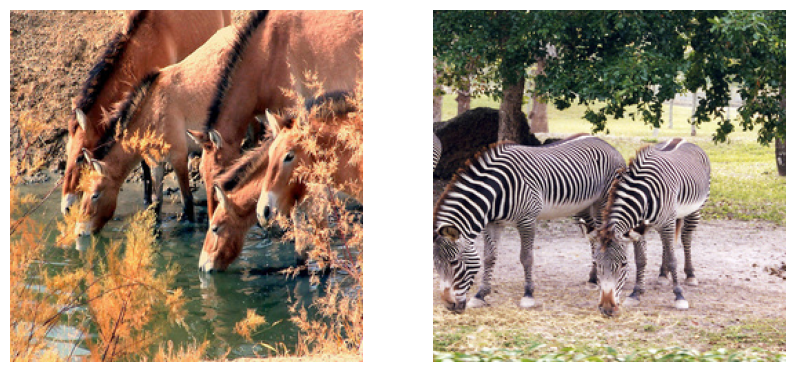

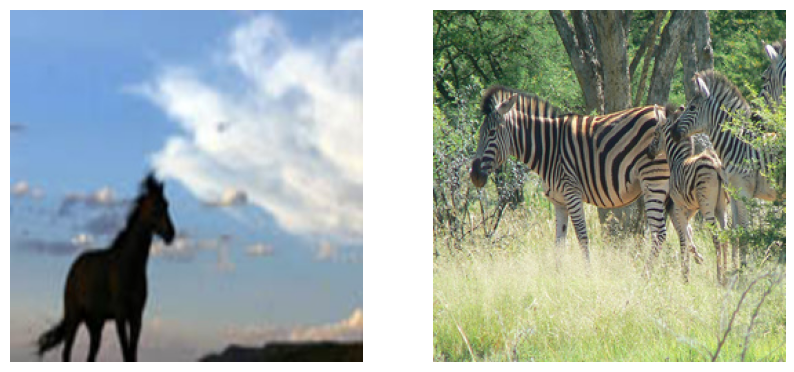

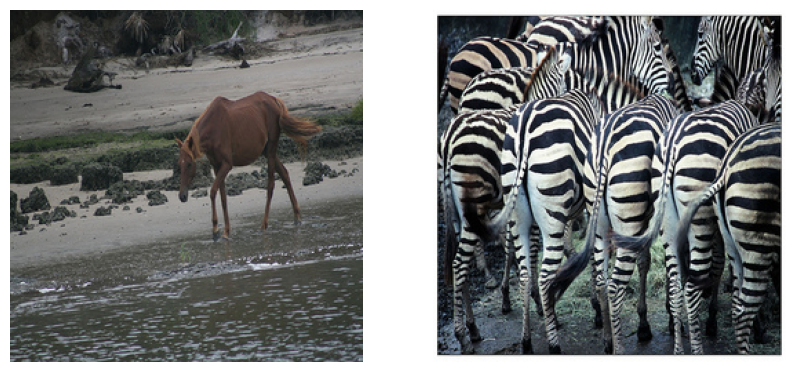

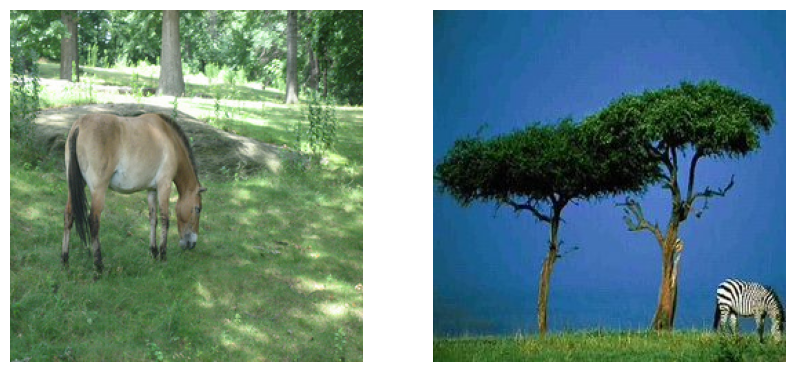

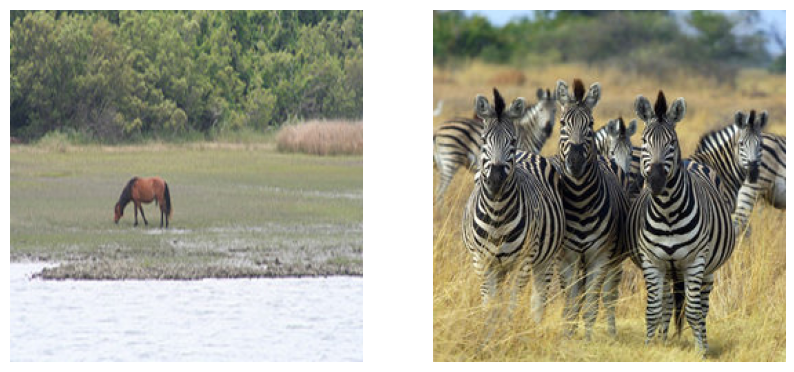

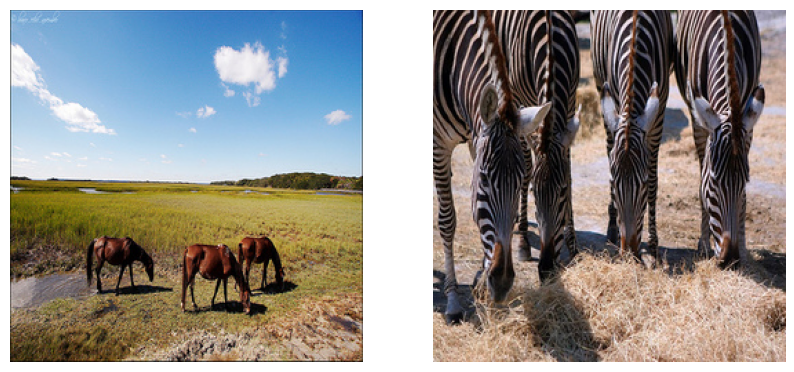

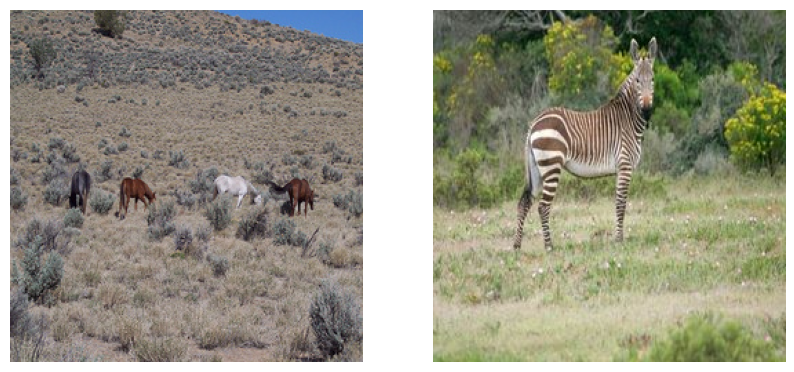

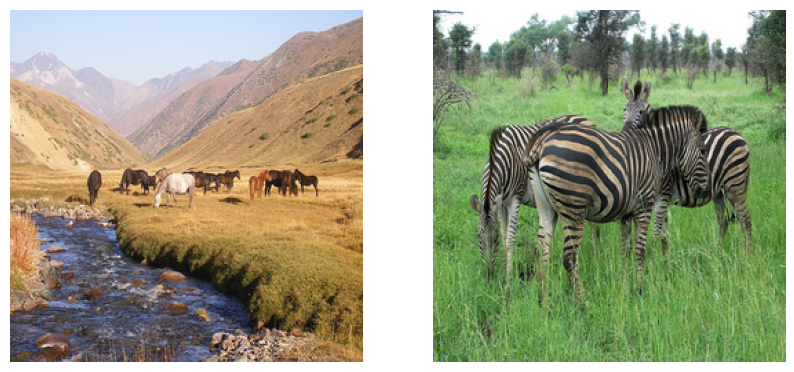

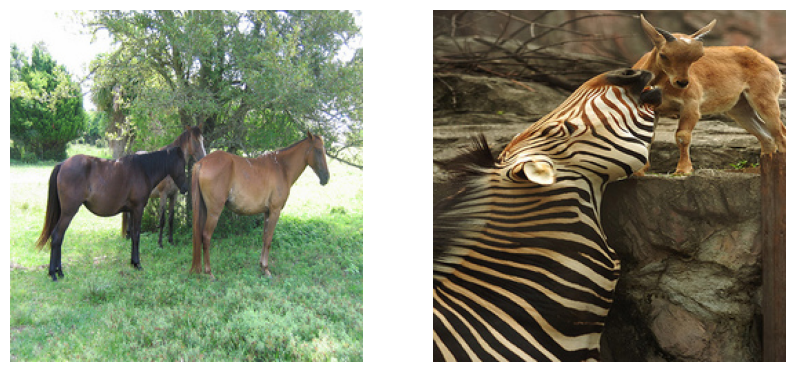

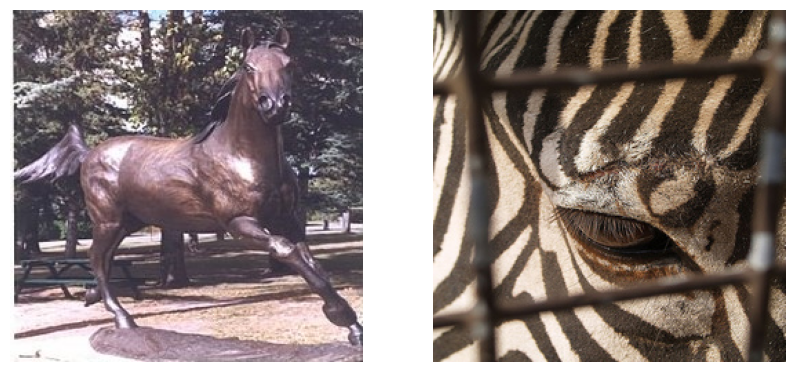

In [9]:
# Visualizing
for i in range(10):
    id = np.random.randint(len(horse_images))
    horse, zebra = horse_images[id], zebra_images[id]

    plt.figure(figsize=(10,8))

    plt.subplot(1,2,1)
    show_image(horse)

    plt.subplot(1,2,2)
    show_image(zebra)
    plt.show()

As you can easily notice, there is **no direct relation** between **horses and zebras** with respect to the images we are going to feed into the model. So somehow the model will have to understand the **actual important information** about **horses and zebras**, and at the same time it should also learn to **transform a horse to a zebra or zebra to a horse**. This seems to be a tough task, and Indeed it is. That's why a new **architecture was proposed to solve the problem**.

# **Generator**

The **overall generator** is the same as the **previous generator** used in **pixel to pixel GAN**, but this time the generator has a **New Residual block**. Let's create this **Residual Block**, this **residual block** has the **2 set** **Convolutional layer** followed by **instance normalization**, which is in last followed by a **Skip Connection**.

In [10]:
def ResidualBlock(filters, layer, index):
#     init = RandomNormal(stddev=0.02)

    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False, name="Block_{}_Conv1".format(index))(layer)
    x = InstanceNormalization(axis=-1, name="Block_{}_Normalization1".format(index))(x)
    x = ReLU(name="Block_{}_ReLU".format(index))(x)

    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False, name="Block_{}_Conv2".format(index))(x)
    x = InstanceNormalization(axis=-1, name="Block_{}_Normalization2".format(index))(x)

    x = concatenate([x, layer], name="Block_{}_Merge".format(index))

    return x

The **residual network** uses a **stride = 1**. That means it does **not decreases** the **size of the input image**. All it does is it **learns the features of the image**.

![image.png](attachment:9b13c8e0-ce43-4527-878a-be0137e9758c.png)

Let's create the **main model architecture**.

In [11]:
def downsample(filters, layer, size=3, strides=2, activation=None, index=None, norm=True):
    x = Conv2D(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False, name="Encoder_{}_Conv".format(index))(layer)
    if norm:
        x = InstanceNormalization(axis=-1, name="Encoder_{}_Normalization".format(index))(x)
    if activation is not None:
        x = Activation(activation, name="Encoder_{}_Activation".format(index))(x)
    else:
        x = LeakyReLU( name="Encoder_{}_LeakyReLU".format(index))(x)
    return x

The **downsample layer**, will simply **decrease the size of the input image by 2**.

In [12]:
def upsample(filters, layer, size=3, strides=2, index=None):
    x = Conv2DTranspose(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False, name="Decoder_{}_ConvT".format(index))(layer)
    x = InstanceNormalization(axis=-1, name="Decoder_{}_Normalization".format(index))(x)
    x = ReLU( name="Encoder_{}_ReLU".format(index))(x)
    return x

**Upsample** will perform the **exact opposite** and will **increase the image size by 2**.

In [13]:
def Generator(n_resnet=9, name="Generator"):

    inp_image = Input(shape=(SIZE, SIZE, 3), name="InputImage")         # 256 x 256 x3

    x = downsample(64, inp_image, size=7, strides=1, index=1)           # 256 x 256 x 64
    x = downsample(128, x, index=2)                                     # 128 x 128 x 128
    x = downsample(256, x, index=3)                                     # 64 x 64 x 256

    for i in range(n_resnet):
        x = ResidualBlock(256, x, index=i+4)                             # (64 x 64 x 256) x n_resnet

    x = upsample(128, x, index=13)                                       # 128 x 128 x 128
    x = upsample(64, x, index=14)                                        # 256 x 256 x 64
    x = downsample(3, x, size=7, strides=1, activation='tanh', index=15) # 256 x 256 x 3

    model = Model(
        inputs=inp_image,
        outputs=x,
        name=name
    )
    return model

The **final generator** is basically the **combination of down sample layers**, **upsample layers** and most importantly the **residual block layers**. The main function of **residual block layers** is to actually learn the **hidden patterns in the data**. In our case, that means to learn **what a horse looks like** and **what a zebra looks like**. So our generator is ready, let's move towards the **discriminator**.

# **Discriminator**

As I mentioned, the **discriminator** is **exactly the same** as the one we have previously used in **pixel to pixel GAN**. The only thing we need to keep in mind is that instead of using **batch normalization**, we need to use **instance normalization**.

In [14]:
def Discriminator(name='Discriminator'):
    init = RandomNormal(stddev=0.02)
    src_img = Input(shape=(SIZE, SIZE, 3), name="InputImage")     # 256 x 256 x 3
    x = downsample(64, src_img, size=4, strides=2, index=1, norm=False) # 128 x 128 x 64
    x = downsample(128, x, size=4, strides=2, index=2)            # 64 x 64 x 128
    x = downsample(256, x, size=4, strides=2, index=3)            # 32 x 32 x 256
    x = downsample(512, x, size=4, strides=2, index=4)            # 16 x 16 x 512
    x = downsample(512, x, size=4, strides=2, index=5)            # 8 x 8 x 512  # we can try out a different architecture with zero padding layer.
    patch_out = Conv2D(1, kernel_size=4, padding='same', kernel_initializer=init, use_bias=False)(x) # 8 x 8 x 1

    model = Model(
        inputs=src_img,
        outputs=patch_out,
        name=name
    )
    model.compile(
        loss='mse',
        optimizer=Adam(learning_rate=2e-4, beta_1=0.5),
        loss_weights=[0.5]
    )
    return model

# **Training Functions**

In [15]:
def CombineModel(g_model1, g_model2, d_model, name):
    # train the Generator
    g_model1.trainable = True

    # Stop the Discriminator and 2nd Generator
    d_model.trainable = False
    g_model2.trainable = False

    # Adversarial Loss
    input_gen = Input(shape=(SIZE, SIZE, 3))
    gen_1_out = g_model1(input_gen)
    dis_out = d_model(gen_1_out)

    # Identity Loss
    input_id = Input(shape=(SIZE, SIZE, 3))
    output_id = g_model1(input_id)

    # Cycle Loss - Forward
    output_f = g_model2(gen_1_out)

    # Cycle Loss - Backward
    gen_2_out = g_model2(input_id)
    output_b = g_model1(gen_2_out)

    # Final Model
    model = Model(
        inputs=[input_gen, input_id],
        outputs=[dis_out, output_id, output_f, output_b],
        name=name
    )
    model.compile(
        loss=['mse', 'mae', 'mae', 'mae'],
        loss_weights=[1,5,10,10],
        optimizer= Adam(learning_rate=2e-4, beta_1=0.5)
    )
    return model

In [16]:
def generate_real_samples(n_samples, dataset):
    ix = np.random.randint(0,dataset.shape[0], n_samples)
    X = dataset[ix]
    y = np.ones(shape=(n_samples, 8, 8, 1))
    return X, y

In [17]:
def generate_fake_samples(g_model, dataset):
    X = g_model.predict(dataset)
    y = np.zeros(shape=(len(dataset), 8, 8, 1))
    return X, y

In [18]:
def update_image_pool(pool, images, max_size=50):
    selected = list()
    for image in images:
        if len(pool) < max_size:
            pool.append(image)
            selected.append(image)
        elif random() < 0.5:
            selected.append(image)
        else:
            ix = np.random.randint(0,len(pool))
            selected.append(pool[ix])
            pool[ix] = image
    return np.asarray(selected)

In [19]:
def show_preds(g_AB, g_BA,n_images=1):
    for i in range(n_images):

        id = np.random.randint(len(horse_images))
        horse, zebra = horse_images[id], zebra_images[id]
        horse_pred, zebra_pred = g_BA.predict(tf.expand_dims(zebra,axis=0))[0], g_AB.predict(tf.expand_dims(horse,axis=0))[0]

        plt.figure(figsize=(10,8))

        plt.subplot(1,4,1)
        show_image(horse, title='Original Horse')

        plt.subplot(1,4,2)
        show_image(zebra_pred, title='Generated Zebra')

        plt.subplot(1,4,3)
        show_image(zebra, title='Original Zebra')

        plt.subplot(1,4,4)
        show_image(horse_pred, title='Genrated Horse')

        plt.tight_layout()
        plt.show()

In [20]:
def train(d_model_A, d_model_B, gen_AB, gen_BA, c_AB, c_BA, epochs=10, chunk=5):

    n_epochs, n_batch = epochs, 1

    trainA, trainB = dataset
    poolA, poolB = list(), list()

    # in simple words, we are going through the whole data.
    bat_per_epoch = int(len(trainA)/n_batch)
    n_steps = bat_per_epoch

    for j in tqdm(range(1,epochs+1), desc="Epochs"):
        for i in range(n_steps):

            # Let's get some real data in hand.
            X_realA, y_realA = generate_real_samples(n_batch, trainA)
            X_realB, y_realB = generate_real_samples(n_batch, trainB)

            # use our generators to generate some fake data.
            X_fakeA, y_fakeA = generate_fake_samples(gen_BA, X_realB)
            X_fakeB, y_fakeB = generate_fake_samples(gen_AB, X_realA)

            # create a pool of images. You can also understand it like a replay buffer.
            X_fakeA = update_image_pool(poolA, X_fakeA)
            X_fakeB = update_image_pool(poolA, X_fakeB)


            # Let's finally train the gen 2 and get the losses.
            gen_loss2, _, _, _, _ = c_BA.train_on_batch(
                [X_realB, X_realA],
                [y_realB, X_realA, X_realB, X_realA]
            )

            # It's time for our discriminator to win our generator.
            dA_loss_1 = d_model_A.train_on_batch(X_realA, y_realA)
            dA_loss_2 = d_model_A.train_on_batch(X_fakeA, y_fakeA)

            # one cycle is completed, let's move to second cycle.
            gen_loss1, _, _, _, _ = c_AB.train_on_batch(
                [X_realA, X_realB],
                [y_realA, X_realB, X_realA, X_realB]
            )

            # again, let's give some power to our discriminators.
            dB_loss_1 = d_model_B.train_on_batch(X_realB, y_realB)
            dB_loss_2 = d_model_B.train_on_batch(X_fakeB, y_fakeB)

        if (j%chunk)==0:
            show_preds(gen_AB, gen_BA, n_images=1)
            gen_AB.save("GeneratorHtoZ.h5")
            gen_BA.save("GeneratorZtoH.h5")

In [21]:
# let's create our generators.
g_AB = Generator(name="GeneratorAB")
g_BA = Generator(name="GeneratorBA")

# here are the respective discriminators.
d_A = Discriminator(name="DiscriminatorA")
d_B = Discriminator(name="DiscriminatorB")

# finally, let's combine all of them.
c_AB = CombineModel(g_AB, g_BA, d_B, name="GanAB")
c_BA = CombineModel(g_BA, g_AB, d_A, name="GanBA")

In [22]:
# # it's time to give them the superior knowledge.
# train(d_A, d_B, g_AB, g_BA, c_AB, c_BA, epochs=100, chunk=5)

In [23]:
# g_AB.save("GeneratorHtoZ.h5")
# g_BA.save("GeneratorZtoH.h5")

In [24]:
HtoZ_gen = load_model("../input/imagetoimage-translation-cyclegan/GeneratorHtoZ.h5")
ZtoH_gen = load_model("../input/imagetoimage-translation-cyclegan/GeneratorZtoH.h5")

1/1 [==============================] - 10s 10s/step


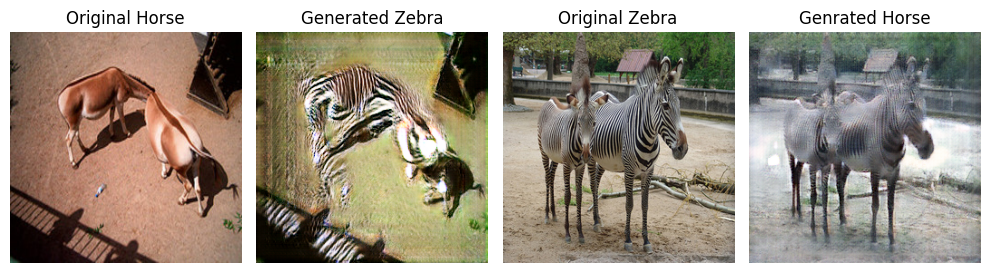

1/1 [==============================] - 9s 9s/step


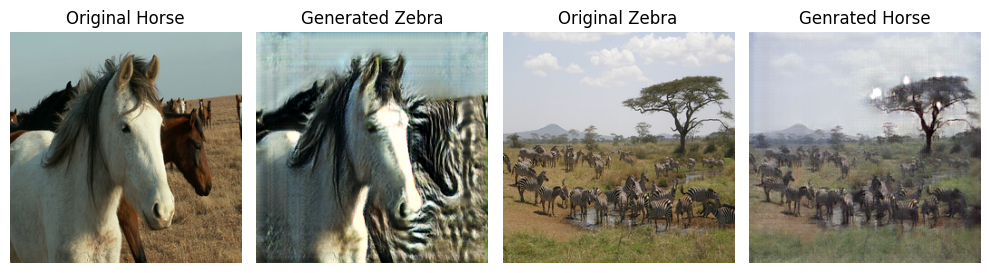

1/1 [==============================] - 5s 5s/step


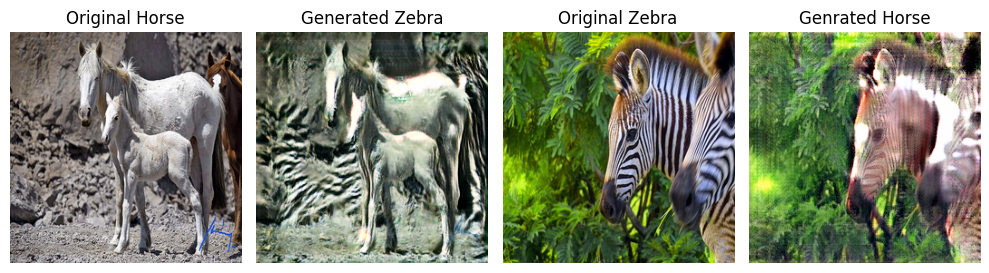

1/1 [==============================] - 5s 5s/step


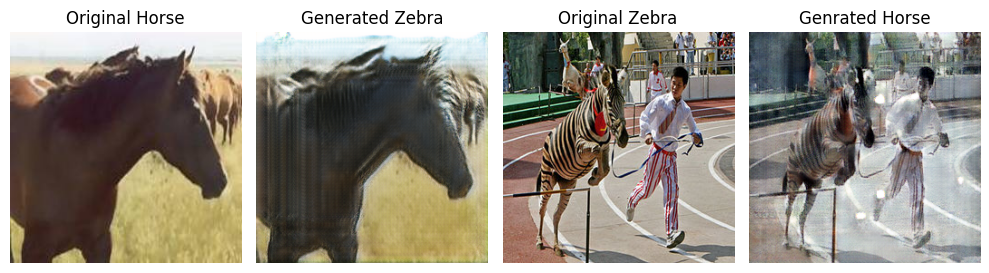

1/1 [==============================] - 9s 9s/step


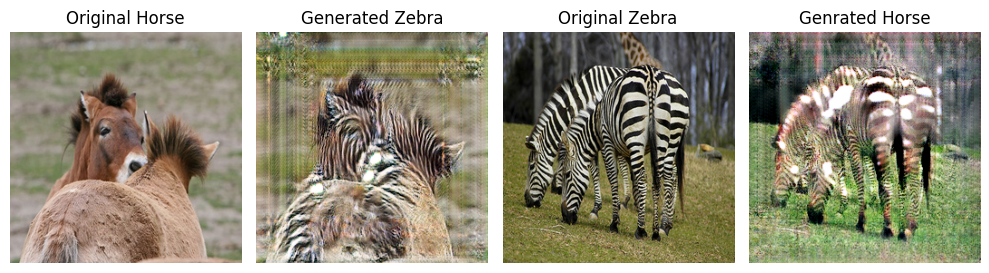

In [25]:
show_preds(HtoZ_gen, ZtoH_gen, n_images=5)

In [26]:
HtoZ_gen_25 = load_model("../input/imagetoimage-translation-cyclegan/GeneratorHtoZ_25.h5")
ZtoH_gen_25 = load_model("../input/imagetoimage-translation-cyclegan/GeneratorZtoH_25.h5")

1/1 [==============================] - 6s 6s/step


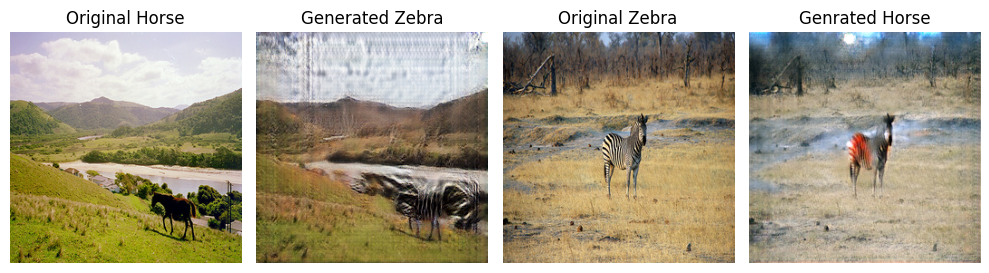

1/1 [==============================] - 5s 5s/step


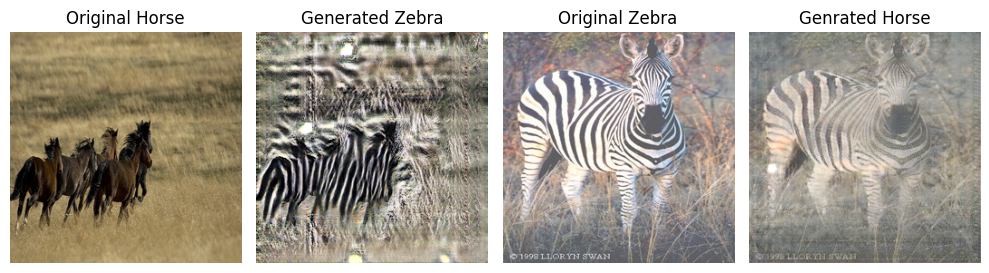

1/1 [==============================] - 5s 5s/step


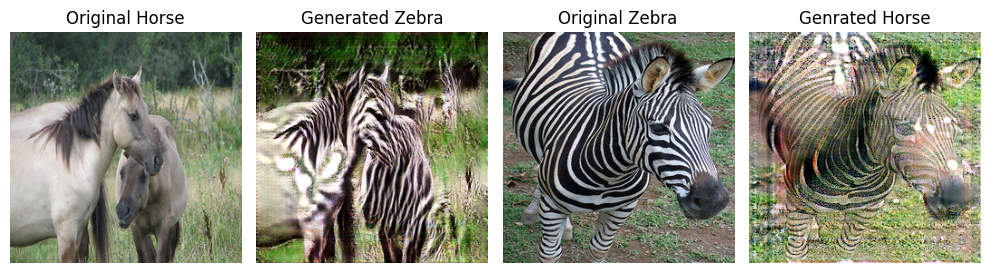

1/1 [==============================] - 5s 5s/step


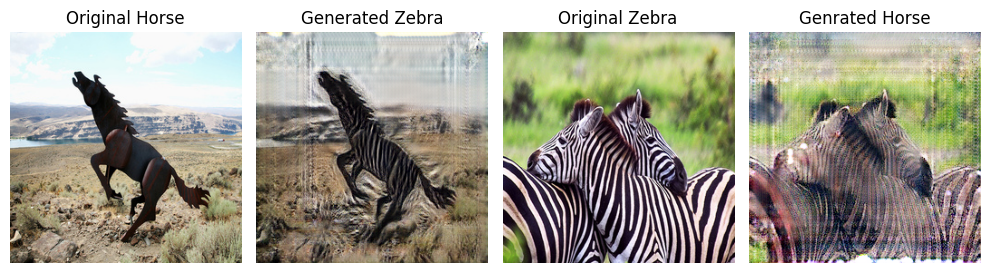

1/1 [==============================] - 5s 5s/step


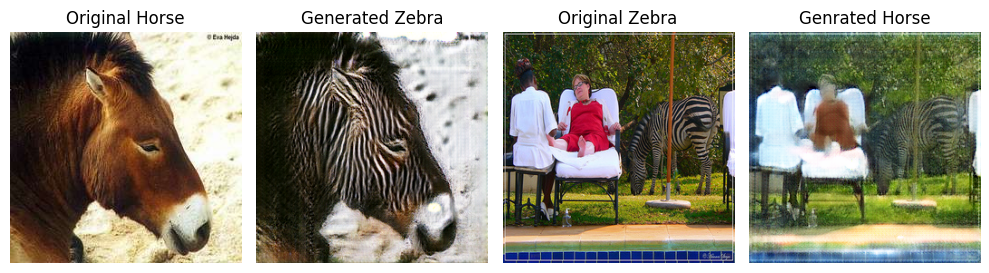

In [27]:
show_preds(HtoZ_gen_25, ZtoH_gen_25, n_images=5)